# Clean and data preparation.

First import pandas and manage the data.


label: sadness (0), joy (1), love (2), anger (3), fear (4), and surprise (5)

In [4]:
import pandas as pd

data = pd.read_csv('./text.csv')

data.head()
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416809 entries, 0 to 416808
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  416809 non-null  int64 
 1   text        416809 non-null  object
 2   label       416809 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 9.5+ MB


With the result we clean the data, deleting duplicate data and null data if exists.

In [5]:
data.dropna(inplace=True)
data.drop_duplicates(inplace=True)

Delete the column of index named 'Unnamed: 0', is important set the name of the column and no the index, because this could delete all data if execute this command repeatedly.
- Rename Heads

In [6]:
data.drop(columns=['Unnamed: 0'], inplace=True)


In [7]:
data = data.rename(columns={'text':'Text','label':'Label'})

Map labels to easy-understable words

In [8]:
label_map = {
    0:'sadness',
    1:'joy',
    2:'love',
    3:'anger',
    4:'fear',
    5:'surprise'
}
data['Label_String'] = data['Label'].map(label_map)
data.head()

,Text,Label,Label_String
0,i just feel really helpless and heavy hearted,4,fear
1,ive enjoyed being able to slouch about relax a...,0,sadness
2,i gave up my internship with the dmrg and am f...,4,fear
3,i dont know i feel so lost,0,sadness
4,i am a kindergarten teacher and i am thoroughl...,4,fear


Calculate string length of text column, strip extra whitespaces and set lowercase the content of Text column.

In [9]:
data['Text_Length'] = data['Text'].str.len()
data['Text'] = data['Text'].str.lower()
data['Text'] = data['Text'].str.strip()
data.head()

,Text,Label,Label_String,Text_Length
0,i just feel really helpless and heavy hearted,4,fear,45
1,ive enjoyed being able to slouch about relax a...,0,sadness,234
2,i gave up my internship with the dmrg and am f...,4,fear,63
3,i dont know i feel so lost,0,sadness,26
4,i am a kindergarten teacher and i am thoroughl...,4,fear,222


Intalling package to next task. Emoji library

In [10]:
pip install emoji

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 433.8/433.8 kB 3.7 MB/s eta 0:00:00


Remove HTML tags, puntuation, emojis and urls.

In [11]:
#remove html
import re
import string
import emoji
from bs4 import BeautifulSoup

punctuation = string.punctuation

def remove_urls(text):
    return re.sub(r'http\S+|www\S+','',text)

def remove_html_tags(text):
    soup=BeautifulSoup(text,'html.parser')
    return soup.get_text()

def remove_punctuation(text):
    return text.translate(str.maketrans('','',punctuation))

def remove_emojis(text):
    return emoji.demojize(text)

data['Text'] = data['Text'].apply(remove_html_tags)
data['Text'] = data['Text'].apply(remove_urls)
data['Text'] = data['Text'].apply(remove_punctuation)
data['Text'] = data['Text'].apply(remove_emojis)
data.head()



,Text,Label,Label_String,Text_Length
0,i just feel really helpless and heavy hearted,4,fear,45
1,ive enjoyed being able to slouch about relax a...,0,sadness,234
2,i gave up my internship with the dmrg and am f...,4,fear,63
3,i dont know i feel so lost,0,sadness,26
4,i am a kindergarten teacher and i am thoroughl...,4,fear,222


Retrieve json file with abbrevations handing and applying in data.

In [12]:
#Importing json
chat_words  = pd.read_json('./abbreviations.json', orient='index')

def replace_chat_words(text):
    words=text.split()
    for i, word in enumerate(words):

        if word.upper() in chat_words:
            words[i] = chat_words[word.upper()].lower()
    return ' '.join(words)

data['Text'] = data['Text'].apply(replace_chat_words)
data.head()



,Text,Label,Label_String,Text_Length
0,i just feel really helpless and heavy hearted,4,fear,45
1,ive enjoyed being able to slouch about relax a...,0,sadness,234
2,i gave up my internship with the dmrg and am f...,4,fear,63
3,i dont know i feel so lost,0,sadness,26
4,i am a kindergarten teacher and i am thoroughl...,4,fear,222


Deleting stop words. These words are very common and don't have a significant meaning.

In [13]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

def remove_stopwords(text):
    words=text.split()
    filtered_words=[word for word in words if word.lower() not in stop_words]
    return ' '.join(filtered_words)

data['Text'] = data['Text'].apply(remove_stopwords)
data.head()



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,Text,Label,Label_String,Text_Length
0,feel really helpless heavy hearted,4,fear,45
1,ive enjoyed able slouch relax unwind frankly n...,0,sadness,234
2,gave internship dmrg feeling distraught,4,fear,63
3,dont know feel lost,0,sadness,26
4,kindergarten teacher thoroughly weary job take...,4,fear,222


Stemming words, is for group variants of the same word to be treated as a single element (running as run). It reduces the complexity of the language and minimizes the number of variants the system needs to handle.

In [14]:
from nltk.stem import PorterStemmer

porter_stemmer=PorterStemmer()
data['Text_Stemmed'] = data['Text'].apply(lambda x: ' '.join([porter_stemmer.stem(word) for word in x.split()]))

data.head()

,Text,Label,Label_String,Text_Length,Text_Stemmed
0,feel really helpless heavy hearted,4,fear,45,feel realli helpless heavi heart
1,ive enjoyed able slouch relax unwind frankly n...,0,sadness,234,ive enjoy abl slouch relax unwind frankli need...
2,gave internship dmrg feeling distraught,4,fear,63,gave internship dmrg feel distraught
3,dont know feel lost,0,sadness,26,dont know feel lost
4,kindergarten teacher thoroughly weary job take...,4,fear,222,kindergarten teacher thoroughli weari job take...


Analyze data a visualization: Bar diagram and heat map

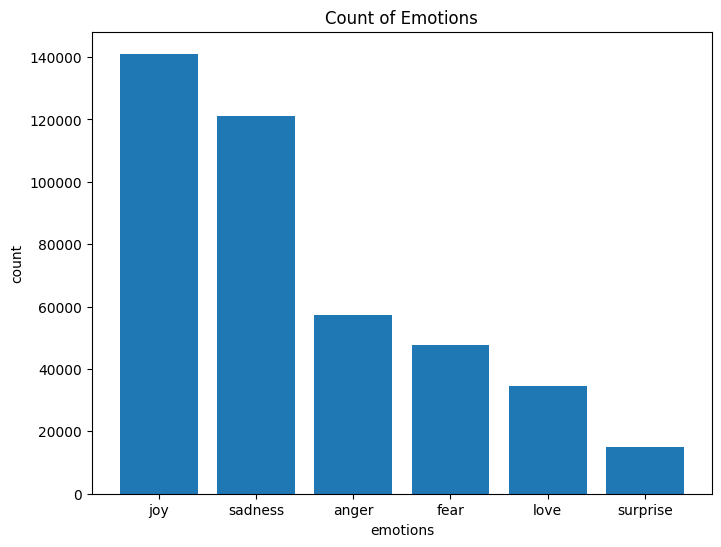

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

label_counts = data['Label_String'].value_counts()

plt.figure(figsize=(8,6))
plt.bar(label_counts.index,label_counts.values)

plt.xlabel('emotions')
plt.ylabel('count')
plt.title('Count of Emotions')
plt.show()

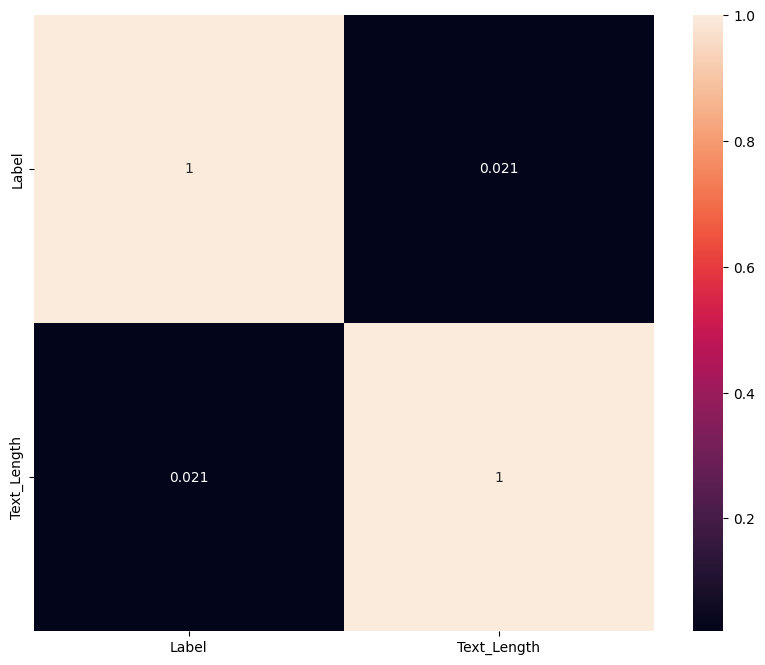

In [16]:
# relationship between emotion and text length
new_data = data[['Label','Text_Length']]
plt.figure(figsize=(10,8))
sns.heatmap(new_data.corr(),annot=True)
plt.show()

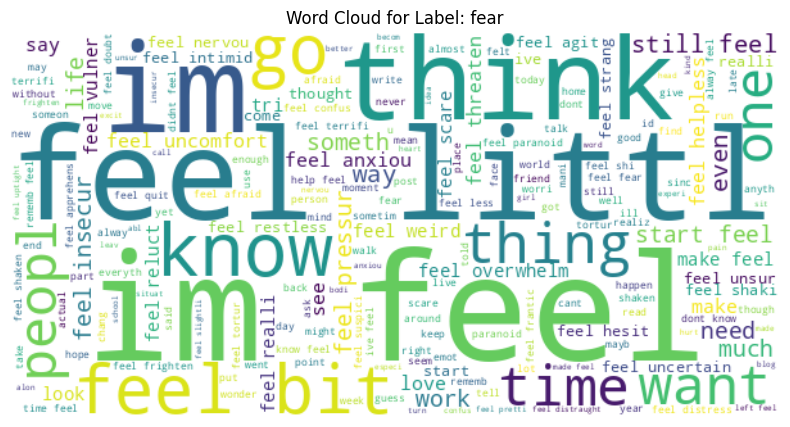

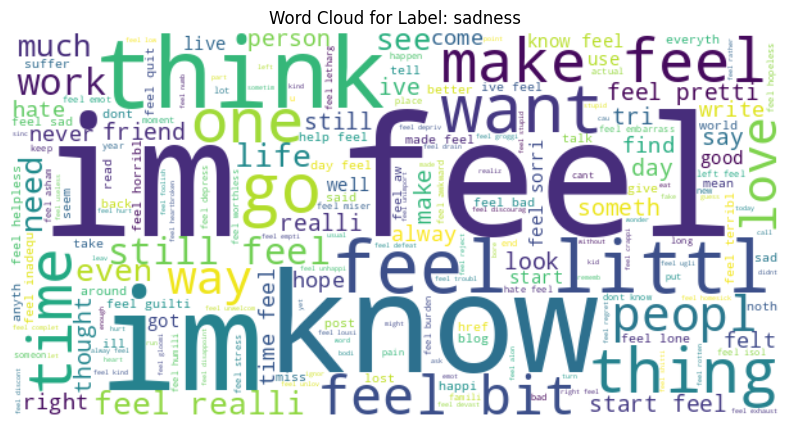

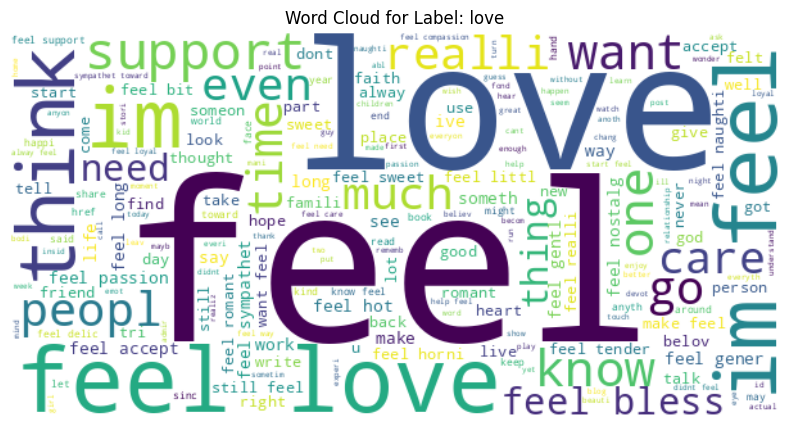

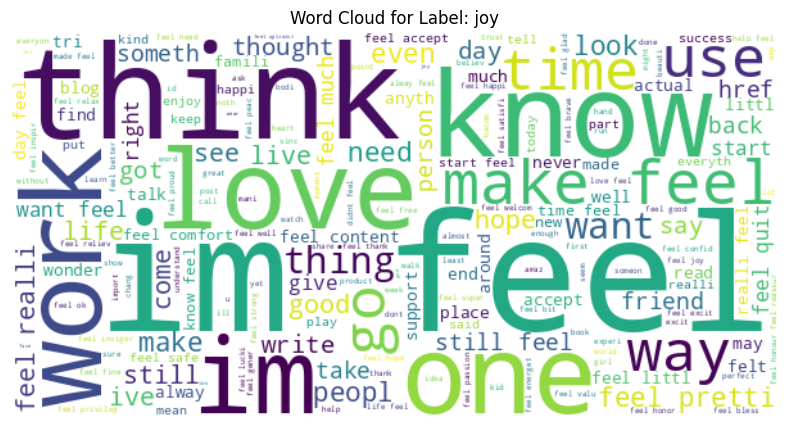

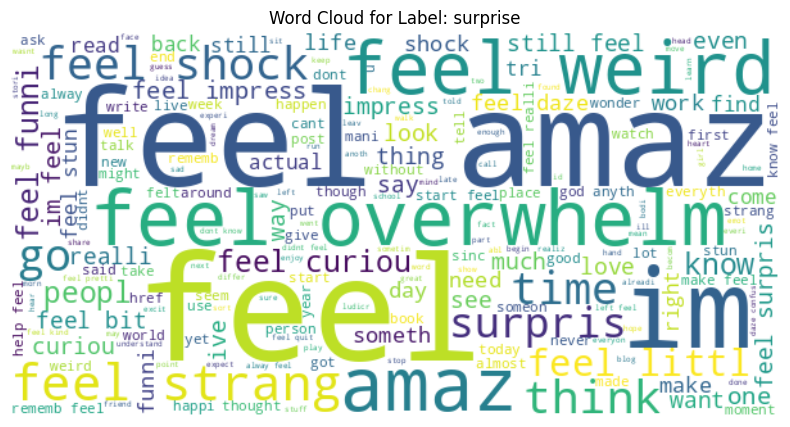

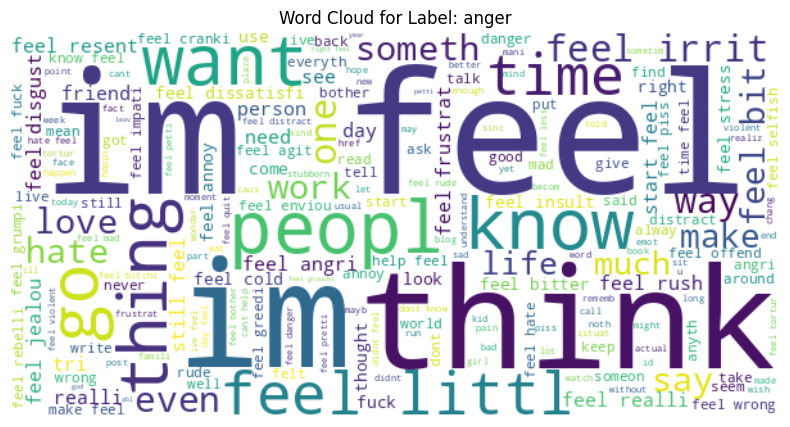

In [17]:
# Word cloud
# feature extraction, bag of words
for label in data['Label_String'].unique():
    filtered_data = data[data['Label_String']==label]
    text = ' '.join(filtered_data['Text_Stemmed'])

    wordcloud = WordCloud(width=600,height=300,background_color='white').generate(text)

    plt.figure(figsize=(10,5))
    plt.imshow(wordcloud,interpolation='bilinear')
    plt.title(f'Word Cloud for Label: {label}')
    plt.axis('off')
    plt.show()

Correlation between emotions

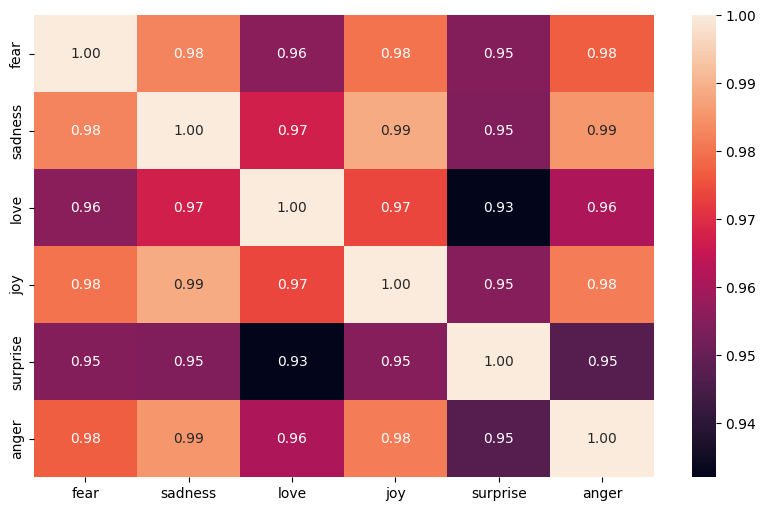

In [18]:
from sklearn.feature_extraction.text import CountVectorizer
emotions = data['Label_String'].unique()
word_counts_per_emotion = {}

for emotion in emotions:
    # create a vector DataFrame for each emotion
    sub_data = data[data['Label_String'] == emotion]

    # use CountVectorizer calculating word frenquency
    vectorizer = CountVectorizer(stop_words='english')
    X = vectorizer.fit_transform(sub_data['Text_Stemmed'])

    word_counts = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())
    word_counts_per_emotion[emotion] = word_counts.sum().sort_values(ascending=False)

# Combine word counts for all emotions into one DataFrame
all_word_counts = pd.concat(word_counts_per_emotion, axis=1)

# visualize the collaboration matrix using a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(all_word_counts.corr(), annot=True, fmt=".2f")
plt.show()

With this first step we need to save the clened data and prepare it to the next step.

In [19]:
data.reset_index(drop=True)
data.to_pickle('./cleaned_data.pkl')



In [20]:
import pandas as pd
data_cleaned = pd.read_pickle('./cleaned_data.pkl')
data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416809 entries, 0 to 416808
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   Text          416809 non-null  object
 1   Label         416809 non-null  int64 
 2   Label_String  416809 non-null  object
 3   Text_Length   416809 non-null  int64 
 4   Text_Stemmed  416809 non-null  object
dtypes: int64(2), object(3)
memory usage: 15.9+ MB


In [21]:
# Check data.
data_cleaned.head()
data_cleaned.reset_index(drop=True)

,Text,Label,Label_String,Text_Length,Text_Stemmed
0,feel really helpless heavy hearted,4,fear,45,feel realli helpless heavi heart
1,ive enjoyed able slouch relax unwind frankly n...,0,sadness,234,ive enjoy abl slouch relax unwind frankli need...
2,gave internship dmrg feeling distraught,4,fear,63,gave internship dmrg feel distraught
3,dont know feel lost,0,sadness,26,dont know feel lost
4,kindergarten teacher thoroughly weary job take...,4,fear,222,kindergarten teacher thoroughli weari job take...
...,...,...,...,...,...
416804,feel like telling horny devils find site suite...,2,love,132,feel like tell horni devil find site suit sort...
416805,began realize feeling agitated restless would ...,3,anger,111,began realiz feel agit restless would thought ...
416806,feel curious previous early dawn time seek tro...,5,surprise,90,feel curiou previou earli dawn time seek troubl
416807,feel becuase tyranical nature government el sa...,3,anger,222,feel becuas tyran natur govern el salvador sav...


#  Split data and preparation for train

The data is split in a proportion 20/80 test/train.

In [22]:
from sklearn.model_selection import train_test_split

X = data_cleaned['Text_Stemmed']
y = data_cleaned['Label'].astype(int)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

print('X_train shape:', X_train.shape)
print('y_train shape:', y_train.shape)
print('X_test shape:', X_test.shape)
print('y_test shape:', y_test.shape)


X_train shape: (333447,)
y_train shape: (333447,)
X_test shape: (83362,)
y_test shape: (83362,)


## Models an training


## With BERT (Distil)


Tokenizer

In [23]:
from transformers import DistilBertTokenizerFast

tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-uncased')

train_encodings = tokenizer(X_train.tolist(), truncation=True, padding=True, max_length=128)
test_encodings = tokenizer(X_test.tolist(), truncation=True, padding=True, max_length=128)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

Pytorch

In [24]:
from torch.utils.data import Dataset, DataLoader

class EmotionDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = EmotionDataset(train_encodings, y_train)
test_dataset = EmotionDataset(test_encodings, y_test)

In [25]:
from transformers import DistilBertForSequenceClassification

model = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=6)

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
pip install accelerate -U

In [ ]:
!pip install jupyter-tensorboard

To visualize the train process.

In [29]:
%load_ext tensorboard
%tensorboard --logdir ./logs

<IPython.core.display.Javascript object>

Fine tunning

In [30]:
from transformers import Trainer, TrainingArguments
import torch

training_args = TrainingArguments(
    output_dir='./results',          # Directorio para guardar los checkpoints
    num_train_epochs=3,              # Número de epochs
    per_device_train_batch_size=256,  # Tamaño del batch de entrenamiento
    per_device_eval_batch_size=512,   # Tamaño del batch de validación
    no_cuda=False,                    # Usa CUDA (GPU) si está disponible
    warmup_steps=500,                # Número de pasos de calentamiento
    weight_decay=0.01,               # Decay de pesos para regularización
    logging_dir='./logs',            # Directorio para los logs
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset
)

trainer.train()

Step,Training Loss


KeyboardInterrupt: 

Save model

In [ ]:
model_path = "emotion_distilbert"
model.save_pretrained(model_path)
tokenizer.save_pretrained(model_path)

In [33]:
from transformers import DistilBertTokenizerFast
# Para cargar el modelo luego:
model_path = "emotion_distilbert"
model = DistilBertForSequenceClassification.from_pretrained(model_path)
tokenizer = DistilBertTokenizerFast.from_pretrained(model_path)

Test

In [36]:
results = trainer.evaluate(test_dataset)
print(results)

Step,Training Loss,Validation Loss
177,No log,0.851570


{'eval_loss': 0.8515697121620178}


## Test


In [37]:

# Testing the model
def predict_emotion(text):
    encoded_text = tokenizer(text, truncation=True, padding=True, max_length=128)
    input_ids = torch.tensor(encoded_text['input_ids']).unsqueeze(0)
    attention_mask = torch.tensor(encoded_text['attention_mask']).unsqueeze(0)

    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask)

    logits = outputs.logits
    _, predicted = torch.max(logits, 1)

    return label_map[predicted.item()]

test_cases = [
    "I'm so happy today!",
    "I'm feeling sad and lonely.",
    "I'm angry at the world.",
    "I'm feeling scared and anxious.",
    "I'm surprised by the news I heard.",
    "I'm in love with my partner."
]

for text in test_cases:
    predicted_emotion = predict_emotion(text)
    print(f"Text: {text}, Predicted Emotion: {predicted_emotion}")


Text: I'm so happy today!, Predicted Emotion: joy
Text: I'm feeling sad and lonely., Predicted Emotion: sadness
Text: I'm angry at the world., Predicted Emotion: anger
Text: I'm feeling scared and anxious., Predicted Emotion: fear
Text: I'm surprised by the news I heard., Predicted Emotion: joy
Text: I'm in love with my partner., Predicted Emotion: love


In [38]:

test_cases = [
    "I'm feeling a bit down today.",
    "I'm not sure how I feel.",
    "I'm kind of happy, but also a bit sad.",
    "I'm feeling overwhelmed and stressed.",
    "I'm not sure if I'm angry or frustrated.",
    "I'm feeling a mix of emotions."
]

for text in test_cases:
    predicted_emotion = predict_emotion(text)
    print(f"Text: {text}, Predicted Emotion: {predicted_emotion}")


Text: I'm feeling a bit down today., Predicted Emotion: sadness
Text: I'm not sure how I feel., Predicted Emotion: fear
Text: I'm kind of happy, but also a bit sad., Predicted Emotion: joy
Text: I'm feeling overwhelmed and stressed., Predicted Emotion: fear
Text: I'm not sure if I'm angry or frustrated., Predicted Emotion: anger
Text: I'm feeling a mix of emotions., Predicted Emotion: fear
